In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import seaborn as sns
from ipywidgets import interact
import plotly.express as px
import warnings

warnings.simplefilter(action='ignore', category=FutureWarning)
pd.options.mode.chained_assignment = None  # default='warn'

%config InlineBackend.figure_format = 'retina' # png, svg, retina

In [2]:
df = pd.read_csv('cleanUFO.csv')

/var/folders/b5/7cx0sbfd5lxddb1vjr5zn7zw0000gn/T/ipykernel_17257/462420286.py:1: DtypeWarning: Columns (6,10) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('cleanUFO.csv')


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 80332 entries, 0 to 80331
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   0                     80332 non-null  int64  
 1   datetime              80332 non-null  object 
 2   city                  80332 non-null  object 
 3   state                 77048 non-null  object 
 4   country               80165 non-null  object 
 5   shape                 78400 non-null  object 
 6   duration (seconds)    80332 non-null  object 
 7   duration (hours/min)  80332 non-null  object 
 8   comments              80317 non-null  object 
 9   date posted           80332 non-null  object 
 10  latitude              80332 non-null  object 
 11  longitude             80332 non-null  float64
dtypes: float64(1), int64(1), object(10)
memory usage: 7.4+ MB


In [4]:
df['datetime'] = df['datetime'].str.replace('24:00', '00:00')
df['datetime'] = pd.to_datetime(df['datetime'])

In [5]:
df['datetime']

0       1949-10-10 20:30:00
1       1949-10-10 21:00:00
2       1955-10-10 17:00:00
3       1956-10-10 21:00:00
4       1960-10-10 20:00:00
                ...        
80327   2013-09-09 21:15:00
80328   2013-09-09 22:00:00
80329   2013-09-09 22:00:00
80330   2013-09-09 22:20:00
80331   2013-09-09 23:00:00
Name: datetime, Length: 80332, dtype: datetime64[ns]

In [6]:
df['date posted'] = df['date posted'].str.replace('24:00', '00:00')
df['date posted'] = pd.to_datetime(df['date posted'])

In [7]:
df['date posted']

0       2004-04-27
1       2005-12-16
2       2008-01-21
3       2004-01-17
4       2004-01-22
           ...    
80327   2013-09-30
80328   2013-09-30
80329   2013-09-30
80330   2013-09-30
80331   2013-09-30
Name: date posted, Length: 80332, dtype: datetime64[ns]

In [8]:
df['state'].fillna('missing', inplace=True)
df['state'] = df['state'].astype(str)
df['state']

0         tx
1         tx
2        eng
3         tx
4         hi
        ... 
80327     tn
80328     id
80329     ca
80330     va
80331     ok
Name: state, Length: 80332, dtype: object

In [9]:
df['city'].fillna('missing', inplace=True)
df['city'] = df['city'].astype(str)
df['city']

0                  san marcos
1                lackland afb
2        chester (uk/england)
3                        edna
4                     kaneohe
                 ...         
80327               nashville
80328                   boise
80329                    napa
80330                  vienna
80331                  edmond
Name: city, Length: 80332, dtype: object

In [10]:
df['country'].fillna('missing', inplace=True)
df['country'] = df['country'].astype(str)
df['country']

0        us
1        us
2        gb
3        us
4        us
         ..
80327    us
80328    us
80329    us
80330    us
80331    us
Name: country, Length: 80332, dtype: object

In [11]:
df['shape'].value_counts()
df['shape'].replace('', 'missing', inplace=True)
df['shape'].value_counts()

light        16565
triangle      7865
circle        7608
fireball      6208
other         5649
unknown       5584
sphere        5387
disk          5213
oval          3733
formation     2457
cigar         2057
changing      1962
flash         1328
rectangle     1297
cylinder      1283
diamond       1178
chevron        952
egg            759
teardrop       750
cone           316
cross          233
delta            7
round            2
crescent         2
pyramid          1
flare            1
hexagon          1
dome             1
changed          1
Name: shape, dtype: int64

In [12]:
df['comments'].fillna('missing', inplace=True)
df['comments'] = df['comments'].astype(str)
df['comments']

0        This event took place in early fall around 194...
1        1949 Lackland AFB&#44 TX.  Lights racing acros...
2        Green/Orange circular disc over Chester&#44 En...
3        My older brother and twin sister were leaving ...
4        AS a Marine 1st Lt. flying an FJ4B fighter/att...
                               ...                        
80327    Round from the distance/slowly changing colors...
80328    Boise&#44 ID&#44 spherical&#44 20 min&#44 10 r...
80329                                         Napa UFO&#44
80330    Saw a five gold lit cicular craft moving fastl...
80331    2 witnesses 2  miles apart&#44 Red &amp; White...
Name: comments, Length: 80332, dtype: object

In [13]:
df['latitude'] = pd.to_numeric(df['latitude'], errors='coerce')
df['latitude']

0        29.883056
1        29.384210
2        53.200000
3        28.978333
4        21.418056
           ...    
80327    36.165833
80328    43.613611
80329    38.297222
80330    38.901111
80331    35.652778
Name: latitude, Length: 80332, dtype: float64

In [14]:
df['longitude'] = pd.to_numeric(df['longitude '], errors='coerce')
df.drop('longitude ', axis=1, inplace=True)
df['longitude']

0        -97.941111
1        -98.581082
2         -2.916667
3        -96.645833
4       -157.803611
            ...    
80327    -86.784444
80328   -116.202500
80329   -122.284444
80330    -77.265556
80331    -97.477778
Name: longitude, Length: 80332, dtype: float64

In [15]:
df['duration'] = pd.to_numeric(df['duration (seconds)'], errors='coerce')
df['duration']

0        2700.0
1        7200.0
2          20.0
3          20.0
4         900.0
          ...  
80327     600.0
80328    1200.0
80329    1200.0
80330       5.0
80331    1020.0
Name: duration, Length: 80332, dtype: float64

In [16]:
df['duration (hours/min)']

0        45 minutes
1           1-2 hrs
2        20 seconds
3          1/2 hour
4        15 minutes
            ...    
80327    10 minutes
80328    20 minutes
80329          hour
80330     5 seconds
80331    17 minutes
Name: duration (hours/min), Length: 80332, dtype: object

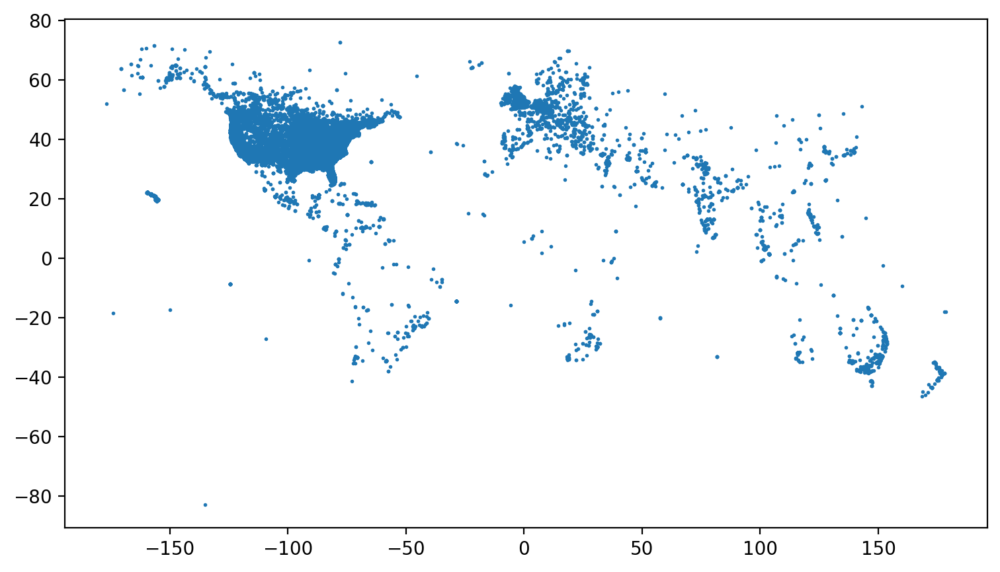

In [17]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(9,5))
ax.scatter(df['longitude'], df['latitude'], s=1) # size = 1.5 per dot
plt.show()

In [18]:
d = df.dropna()
len(d)

78398

In [19]:
d = df.dropna()
rows_dropped = df[~df.index.isin(d.index)]
print("Rows Dropped:")
print(rows_dropped)

Rows Dropped:
           0            datetime                                       city  \
62        63 1995-10-10 19:45:00                                  milwaukee   
63        64 1995-10-10 22:40:00                                    oakland   
239      240 2011-10-10 19:30:00                         murfeesboro/smyrna   
285      286 1986-10-11 20:30:00          alice springs  (nt&#44 australia)   
293      294 1995-10-11 18:30:00                   new york city (brooklyn)   
...      ...                 ...                                        ...   
80128  80129 1999-09-09 22:00:00                               mount shasta   
80155  80156 2002-09-09 19:02:00  moriches bay (long island/atlantic ocean)   
80156  80157 2002-09-09 19:02:00                 moriches bay (long island)   
80179  80180 2003-09-09 22:00:00                                   prescott   
80237  80238 2009-09-09 13:00:00                                   mesquite   

      state country shape duration (s

In [20]:
df = d.copy()

In [21]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 78398 entries, 0 to 80331
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   0                     78398 non-null  int64         
 1   datetime              78398 non-null  datetime64[ns]
 2   city                  78398 non-null  object        
 3   state                 78398 non-null  object        
 4   country               78398 non-null  object        
 5   shape                 78398 non-null  object        
 6   duration (seconds)    78398 non-null  object        
 7   duration (hours/min)  78398 non-null  object        
 8   comments              78398 non-null  object        
 9   date posted           78398 non-null  datetime64[ns]
 10  latitude              78398 non-null  float64       
 11  longitude             78398 non-null  float64       
 12  duration              78398 non-null  float64       
dtypes: datetime64[ns

In [22]:
import pandas as pd
import folium
from folium.plugins import MarkerCluster

# Create a Folium map centered at the United States
m = folium.Map(location=[37.09, -95.71], zoom_start=4)

# Create a MarkerCluster for the UFO sightings
marker_cluster = MarkerCluster().add_to(m)

# Add markers for each UFO sighting
for index, row in df.iterrows():
    folium.Marker([row['latitude'], row['longitude']]).add_to(marker_cluster)

# Save the map to an HTML file
m.save('a-ufo_sightings_map.html')


In [23]:
# import pandas as pd
# import folium
# from folium import Choropleth
# import io
# f = io.open('./gz_2010_us_050_00_500k/gz_2010_us_050_00_500k.shp', 
#             encoding='us-ascii')

# # Create a Folium map centered at the United States
# m = folium.Map(location=[37.09, -95.71], zoom_start=4)

# # Create a Choropleth heatmap layer
# Choropleth(
#     geo_data=f,  # Replace with the path to your GeoJSON file or a GeoJSON dictionary
#     data=df.groupby('state').size().reset_index(name='count'),
#     columns=['state', 'count'],
#     key_on='feature.id',  # Adjust this based on your GeoJSON structure
#     fill_color='YlOrRd',
#     fill_opacity=0.7,
#     line_opacity=0.2,
#     legend_name='UFO Sightings Density',
# ).add_to(m)

# # Save the map to an HTML file
# m.save('a-ufo_sightings_heatmap.html')


In [24]:
# from urllib.request import urlopen
# import json
# with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
#     counties = json.load(response)

# # import pandas as pd
# # df1 = pd.read_csv("https://raw.githubusercontent.com/plotly/datasets/master/fips-unemp-16.csv",
# #                    dtype={"fips": str})

# import plotly.express as px

# fig = px.choropleth(df1, geojson=counties, locations='fips', color='unemp',
#                            color_continuous_scale="Viridis",
#                            range_color=(0, 12),
#                            scope="usa",
#                            labels={'unemp':'unemployment rate'}
#                           )
# fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
# fig.show()

In [25]:
df['shape'].value_counts()
df['shape'].replace('', 'missing', inplace=True)
df['shape'].value_counts()

light        16565
triangle      7865
circle        7607
fireball      6208
other         5649
unknown       5584
sphere        5387
disk          5213
oval          3733
formation     2457
cigar         2057
changing      1962
flash         1328
rectangle     1296
cylinder      1283
diamond       1178
chevron        952
egg            759
teardrop       750
cone           316
cross          233
delta            7
round            2
crescent         2
pyramid          1
flare            1
hexagon          1
dome             1
changed          1
Name: shape, dtype: int64

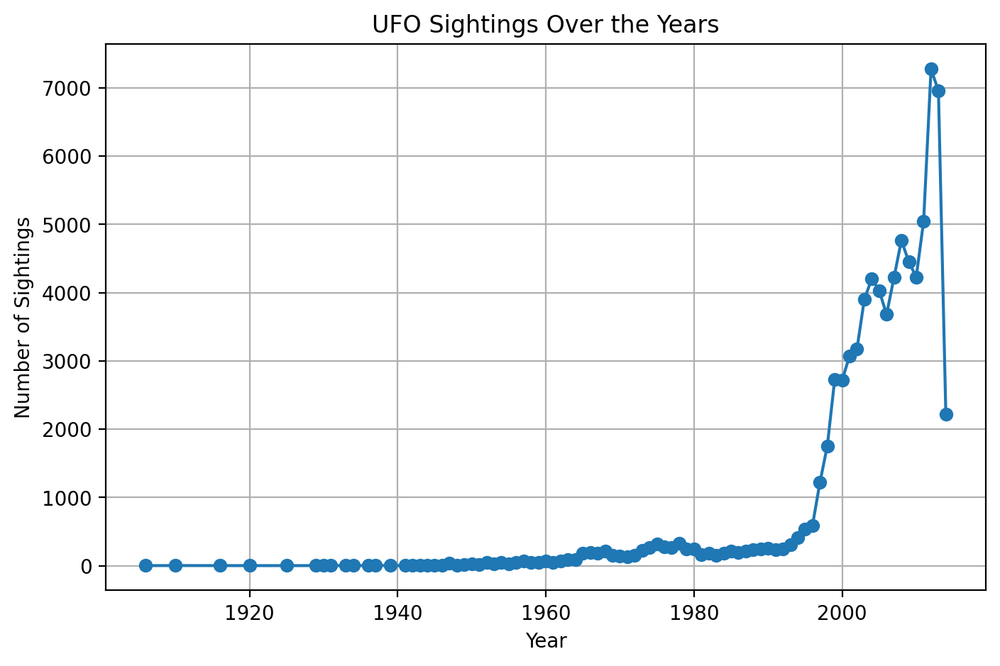

In [26]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# Time Series Analysis
df['year'] = df['datetime'].dt.year
yearly_counts = df['year'].value_counts().sort_index()
plt.figure(figsize=(8, 5))
plt.plot(yearly_counts.index, yearly_counts.values, marker='o')
plt.xlabel('Year')
plt.ylabel('Number of Sightings')
plt.title('UFO Sightings Over the Years')
plt.grid(True)
plt.show()


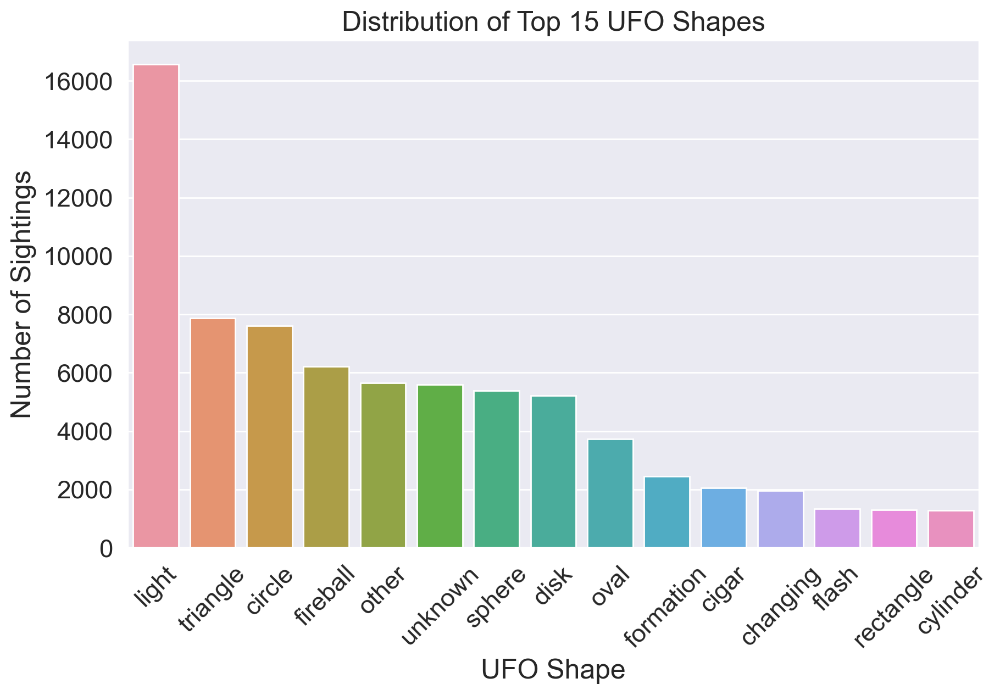

In [27]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'df' contains your UFO dataset

# Get the top 15 UFO shapes by frequency
top_shapes = df['shape'].value_counts().head(15).index

# Filter the data to include only the top 15 shapes
df_top_shapes = df[df['shape'].isin(top_shapes)]
sns.set(font_scale=1.5) 
# Create the countplot
plt.figure(figsize=(10, 6))
sns.countplot(data=df_top_shapes, x='shape', order=top_shapes)
plt.xticks(rotation=45)
plt.xlabel('UFO Shape')
plt.ylabel('Number of Sightings')
plt.title('Distribution of Top 15 UFO Shapes')
plt.show()


In [28]:
df['duration'].describe()

count    7.839800e+04
mean     8.083026e+03
std      5.969395e+05
min      1.000000e-03
25%      3.000000e+01
50%      1.800000e+02
75%      6.000000e+02
max      9.783600e+07
Name: duration, dtype: float64

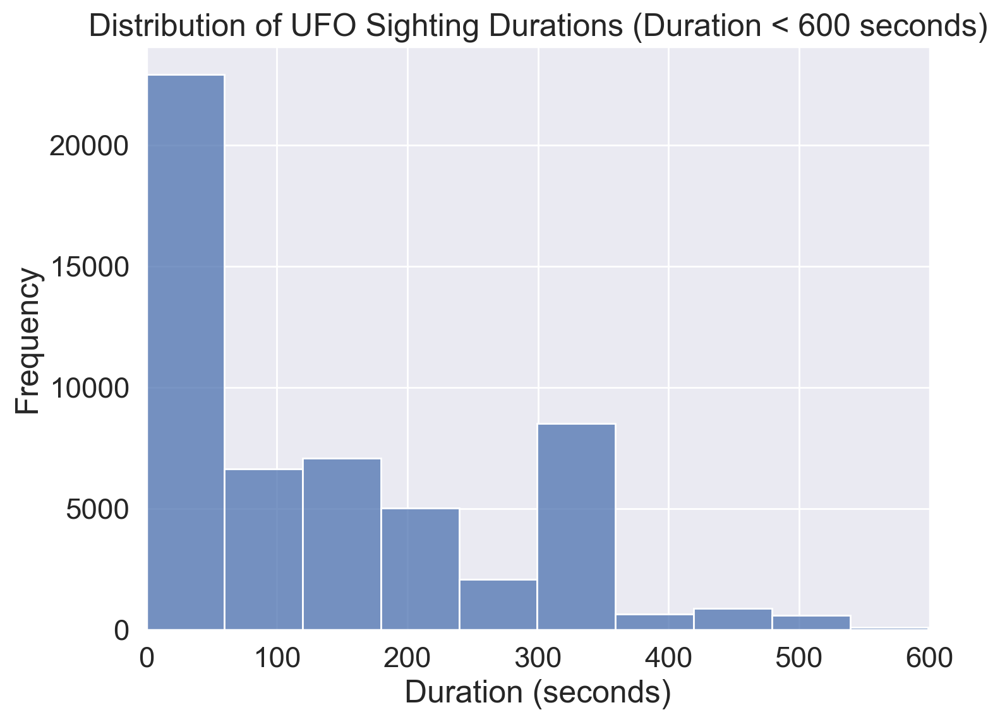

In [42]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Item 4: Duration Analysis (Filtering for values less than 600 seconds)
duration_limit = 600

# Filter the DataFrame to include only rows with duration less than 600 seconds
filtered_df = df[df['duration'] < duration_limit]

plt.figure(figsize=(8, 6))
sns.histplot(filtered_df['duration'], bins=10)
plt.xlabel('Duration (seconds)')
plt.ylabel('Frequency')
plt.title(f'Distribution of UFO Sighting Durations (Duration < {duration_limit} seconds)')
plt.xlim(0, duration_limit)  # Set the x-axis limits

plt.show()


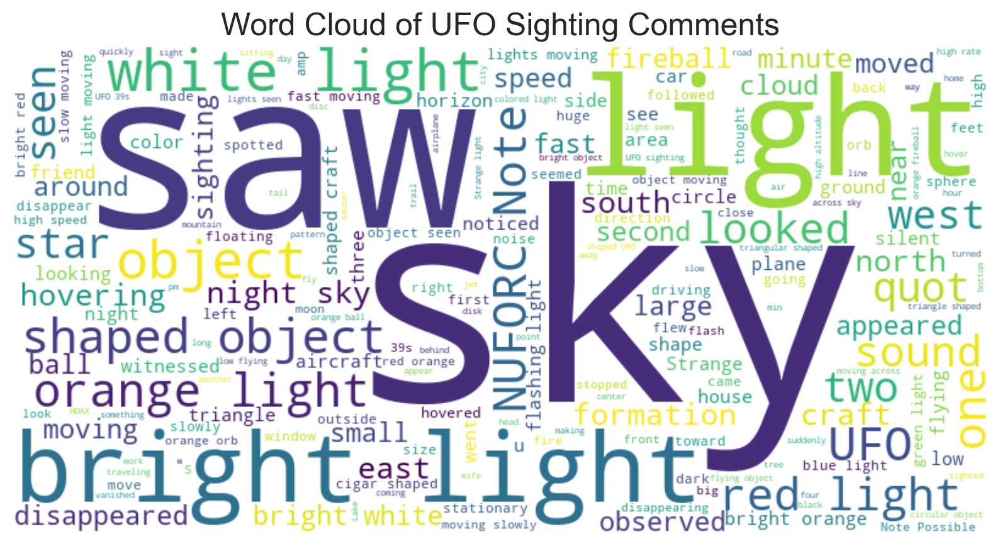

In [48]:
# Item 5: Comments Text Analysis (Word Cloud)
from wordcloud import WordCloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(' '.join(df['comments'].dropna()))
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud of UFO Sighting Comments')
plt.show()

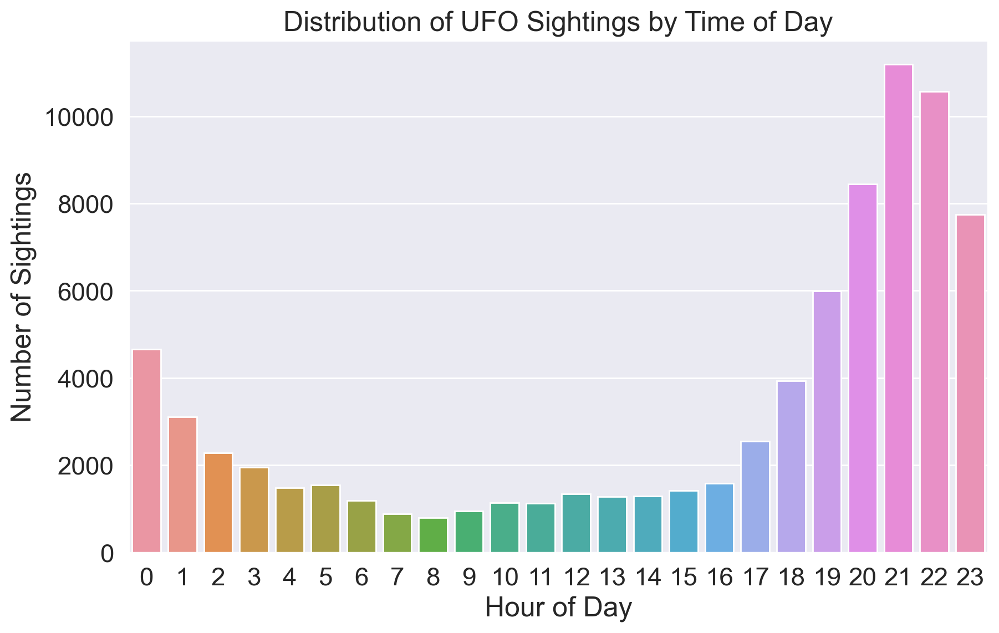

In [31]:
# Item 6: Day and Time Analysis
df['hour'] = df['datetime'].dt.hour
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='hour')
plt.xlabel('Hour of Day')
plt.ylabel('Number of Sightings')
plt.title('Distribution of UFO Sightings by Time of Day')
plt.show()

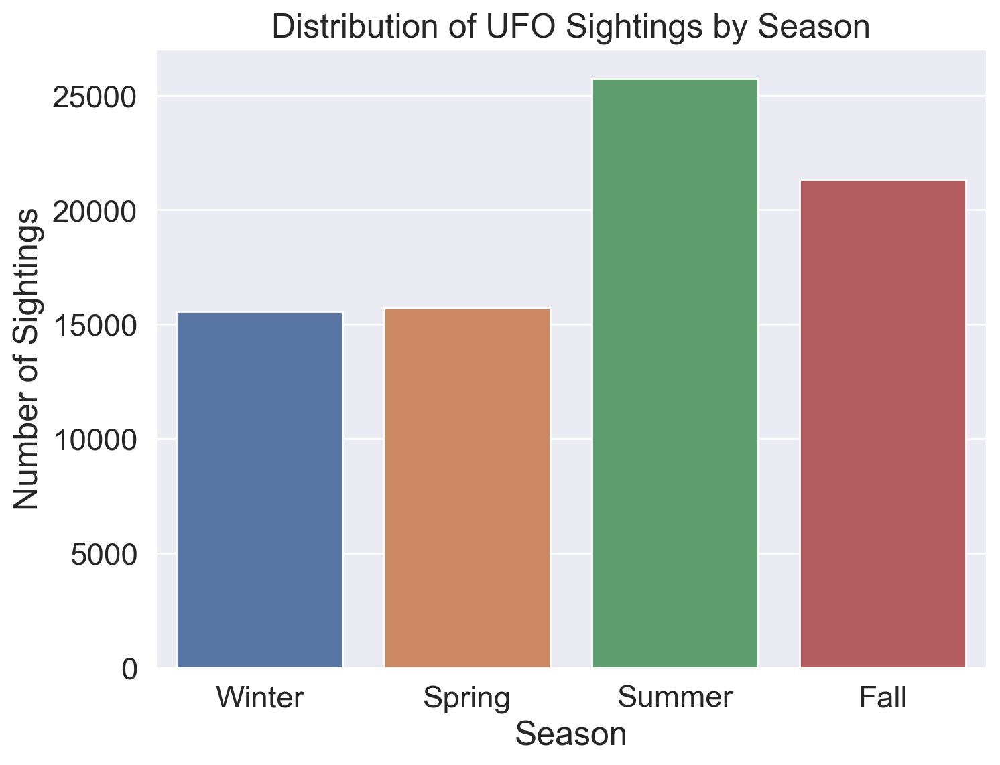

In [77]:
# Item 7: Seasonal Analysis
df['season'] = np.where(df['latitude'] < 0, (df['datetime'].dt.month // 3 + 2) % 4, df['datetime'].dt.month // 3 % 4)
plt.figure(figsize=(8, 6))
sns.countplot(data=df, x='season')
plt.xlabel('Season')
plt.ylabel('Number of Sightings')
plt.title('Distribution of UFO Sightings by Season')
plt.xticks(ticks=[0, 1, 2, 3], labels=['Winter', 'Spring', 'Summer', 'Fall'])
plt.show()

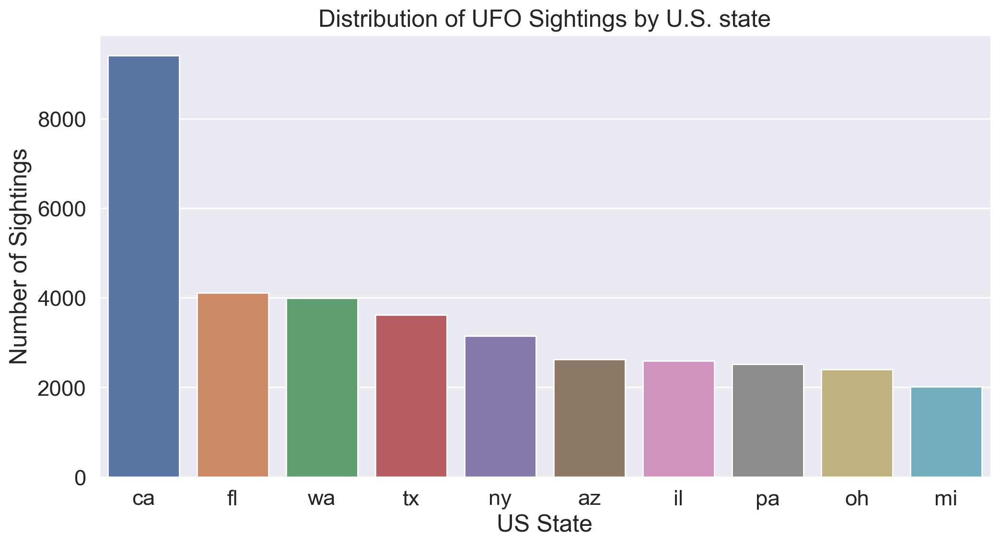

In [80]:
# Item 8: Country and State Analysis
plt.figure(figsize=(12, 6))
sns.countplot(data=df[df['country'] == 'us'], x='state', order=df[df['country'] == 'us']['state'].value_counts().iloc[:10].index)
plt.xlabel('US State')
plt.ylabel('Number of Sightings')
plt.title('Distribution of UFO Sightings by U.S. state')
plt.show()

Not sure this one tells us much

In [34]:
# # Item 9: Duration vs. Year Scatter Plot
# plt.figure(figsize=(10, 6))
# plt.scatter(df['year'], df['duration'], alpha=0.5)
# plt.xlabel('Year')
# plt.ylabel('Duration (seconds)')
# plt.title('Scatter Plot of UFO Sighting Duration vs. Year')
# plt.grid(True)
# plt.show()


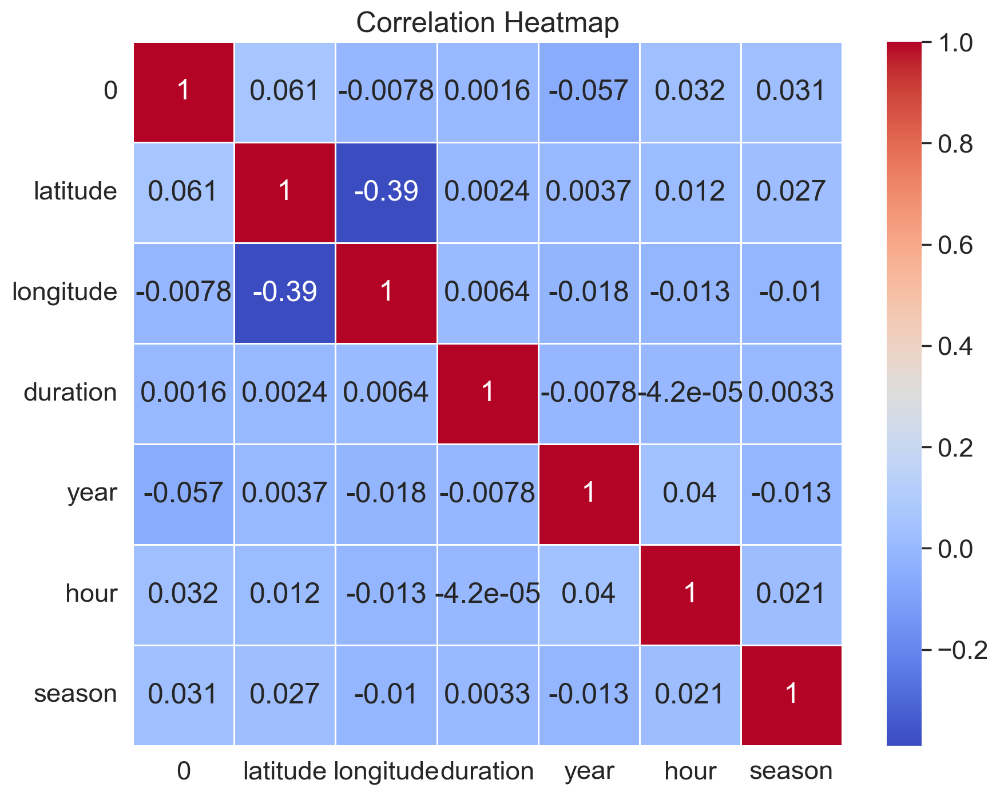

In [35]:
# Compute the correlation matrix
correlation_matrix = df.corr()

# Set up the matplotlib figure
plt.figure(figsize=(10, 8))

# Create a heatmap using Seaborn
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=.5)

# Add a title
plt.title('Correlation Heatmap')

# Show the plot
plt.show()


In [36]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 78398 entries, 0 to 80331
Data columns (total 16 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   0                     78398 non-null  int64         
 1   datetime              78398 non-null  datetime64[ns]
 2   city                  78398 non-null  object        
 3   state                 78398 non-null  object        
 4   country               78398 non-null  object        
 5   shape                 78398 non-null  object        
 6   duration (seconds)    78398 non-null  object        
 7   duration (hours/min)  78398 non-null  object        
 8   comments              78398 non-null  object        
 9   date posted           78398 non-null  datetime64[ns]
 10  latitude              78398 non-null  float64       
 11  longitude             78398 non-null  float64       
 12  duration              78398 non-null  float64       
 13  year            

In [37]:
df['country'].describe()

count     78398
unique      154
top          us
freq      69225
Name: country, dtype: object

In [38]:
69225/78398


0.8829944641444935

In [58]:
import plotly.express as px
# Get a sorted list of unique years
df_sorted = df.sort_values(by='year')

# Assuming 'df' contains your UFO dataset
fig = px.scatter_geo(df_sorted, lat='latitude', lon='longitude', animation_frame='year',
                     title='Animated Map of UFO Sightings Over Time')
fig.update_geos(projection_type='natural earth')
fig.show()

import plotly.io as pio

# Assuming 'fig' contains your Plotly figure
pio.write_html(fig, 'world_sightings_by_year.html')

In [40]:
df1 = df[df['duration']<=40000]

In [59]:
import plotly.graph_objects as go

# Assuming 'df' contains your UFO dataset
fig = go.Figure(go.Densitymapbox(lat=df1['latitude'], lon=df1['longitude'], z=df1['duration'],
                                  radius=10))
fig.update_layout(mapbox_style="stamen-terrain", mapbox_center_lon=180)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

# Assuming 'fig' contains your Plotly figure
pio.write_html(fig, 'world_heatmap.html')

In [74]:
# Assuming 'df' contains your UFO dataset

# Define a set of words to exclude
exclude_words = {'england', 'canada', 'uk'}

# Function to clean and filter text
def preprocess_and_filter(text):
    words = text.split()
    cleaned_words = [word for word in words if word.lower() not in exclude_words]
    return ' '.join(cleaned_words)

# Extract all text from 'city' column, clean, and return as a list
cleaned_city_texts = df['city'].dropna().apply(preprocess_and_filter).tolist()

# Further filtering to exclude any strings containing the excluded words
cleaned_city_texts

import re

# Function to remove text within parentheses
def remove_text_in_parentheses(text):
    return re.sub(r'\([^)]*\)', '', text)

# Remove text within parentheses from each string in the list
cleaned_city_texts = [remove_text_in_parentheses(text) for text in cleaned_city_texts]

cleaned_city = ' '.join(cleaned_city_texts)
# Print the updated list
# print(cleaned_city)


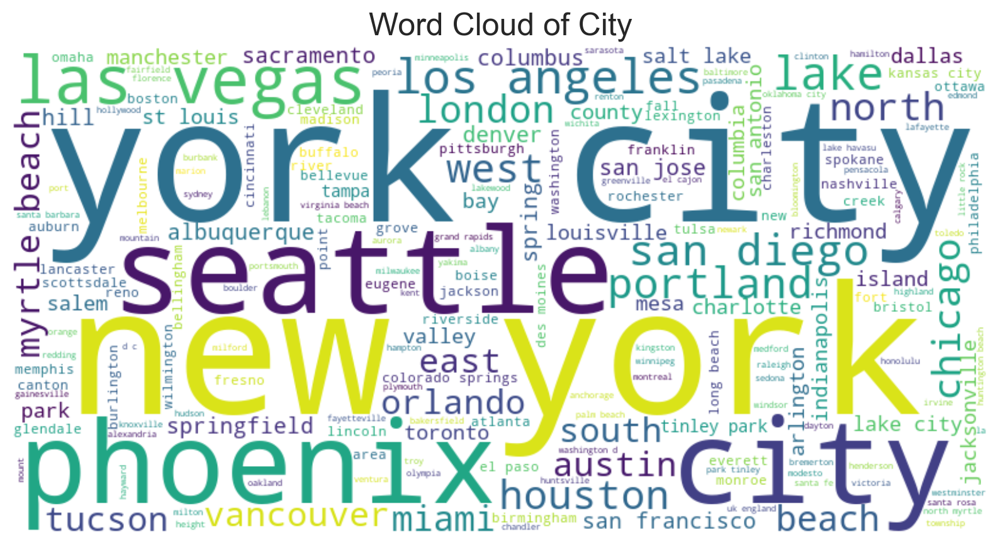

In [76]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

wordcloud = WordCloud(width=800, height=400, background_color='white').generate(cleaned_city)

# Create and display the word cloud plot
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud of City')
plt.axis('off')
plt.show()


In [81]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 78398 entries, 0 to 80331
Data columns (total 16 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   0                     78398 non-null  int64         
 1   datetime              78398 non-null  datetime64[ns]
 2   city                  78398 non-null  object        
 3   state                 78398 non-null  object        
 4   country               78398 non-null  object        
 5   shape                 78398 non-null  object        
 6   duration (seconds)    78398 non-null  object        
 7   duration (hours/min)  78398 non-null  object        
 8   comments              78398 non-null  object        
 9   date posted           78398 non-null  datetime64[ns]
 10  latitude              78398 non-null  float64       
 11  longitude             78398 non-null  float64       
 12  duration              78398 non-null  float64       
 13  year            

In [93]:
import matplotlib.pyplot as plt 
import pandas as pd
import numpy as np
import statsmodels.api as sm
import statsmodels.formula.api as smf

model = smf.ols('hour ~ C(season)', data = df).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   hour   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                  0.001
Method:                 Least Squares   F-statistic:                     31.06
Date:                Tue, 10 Oct 2023   Prob (F-statistic):           4.65e-20
Time:                        11:09:10   Log-Likelihood:            -2.7159e+05
No. Observations:               78398   AIC:                         5.432e+05
Df Residuals:                   78394   BIC:                         5.432e+05
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept         15.0095      0.062    242.226      0.000      14.888      15.131
C(season)[T.1]     0.6536      0.087      7.476      0.000       0.482       0.825
C(season)[T.2]     0.6882      0.078      8.769      0.000       0.534       0.842
C(season)[T.3]     0.6512      0.081      7.992      0.000       0.492       0.811
==============================================================================
Omnibus:                    11790.286   Durbin-Watson:                   0.832
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            13143.222
Skew:                          -0.949   Prob(JB):                         0.00
Kurtosis:                       2.352   Cond. No.                         5.36
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [101]:
tab = pd.crosstab(df['hour'], df['season'])
tab

season,0,1,2,3
hour,,,,
0,977,944,1781,952
1,548,597,1207,756
2,394,432,888,565
3,330,391,744,481
4,258,324,484,417
5,406,254,346,534
6,408,176,160,445
7,296,150,136,298
8,189,181,179,242


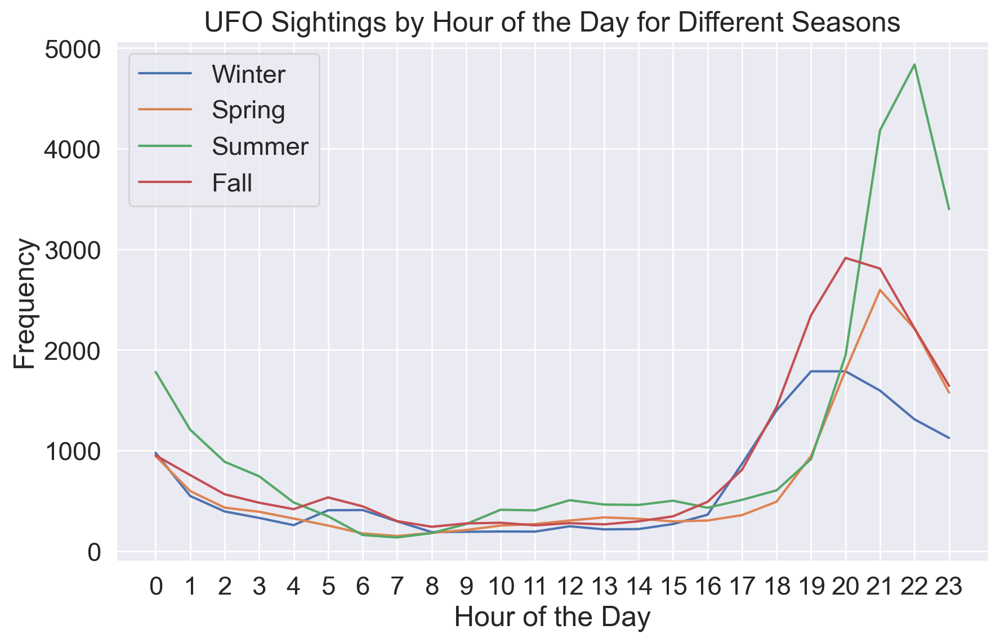

In [105]:
import pandas as pd
import matplotlib.pyplot as plt

# Define the seasons
seasons = {
    0: 'Winter',
    1: 'Spring',
    2: 'Summer',
    3: 'Fall'
}

# Group the data by season and hour, and count the frequency
season_hour_counts = df.groupby(['season', 'hour']).size().unstack(fill_value=0)

# Create a line plot for each season
plt.figure(figsize=(10, 6))
for season_num, season_name in seasons.items():
    plt.plot(season_hour_counts.loc[season_num], label=season_name)

# Customize the plot
plt.xlabel('Hour of the Day')
plt.ylabel('Frequency')
plt.title('UFO Sightings by Hour of the Day for Different Seasons')
plt.xticks(range(24))
plt.legend()
plt.grid(True)

# Show the plot
plt.show()